In [1]:
from google.colab import drive

# Google Drive'ı bağlama
drive.mount('/content/drive')



Mounted at /content/drive


HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_21.png - IoU: 0.4585


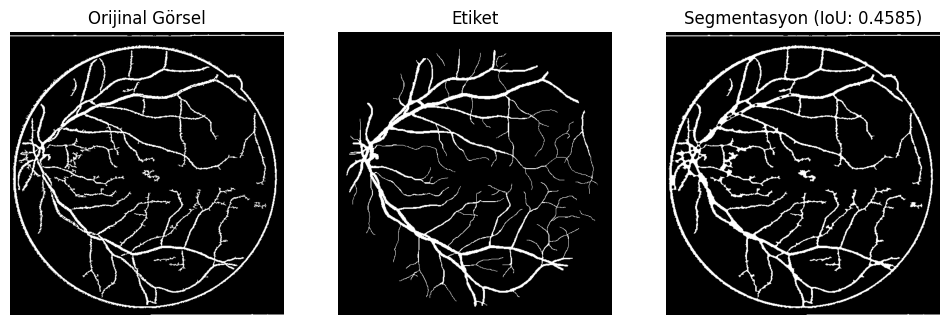

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_22.png - IoU: 0.4580


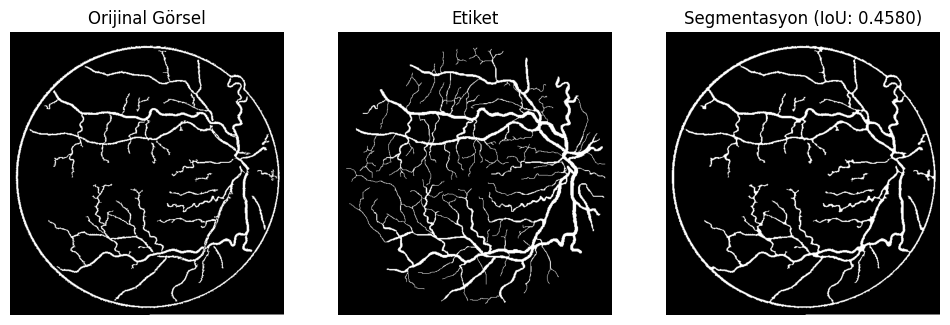

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_24.png - IoU: 0.4911


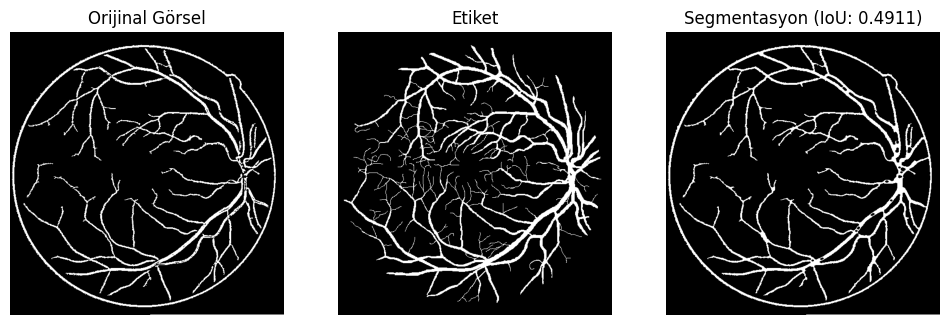

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_27.png - IoU: 0.4663


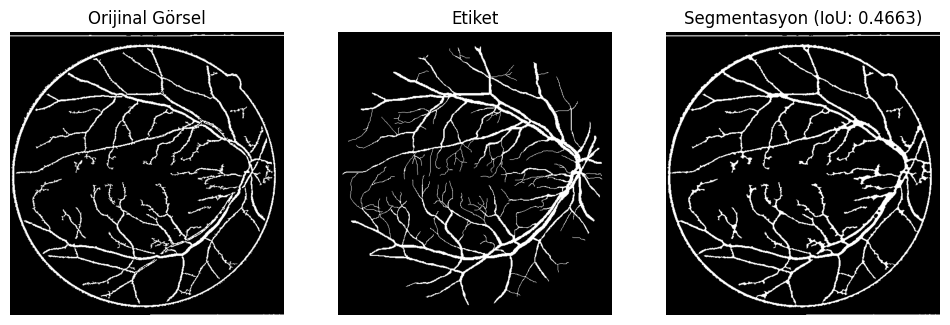

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_28.png - IoU: 0.4925


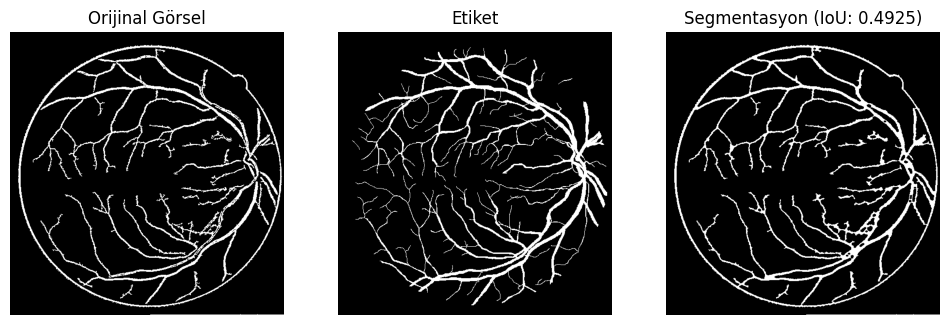

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_31.png - IoU: 0.4301


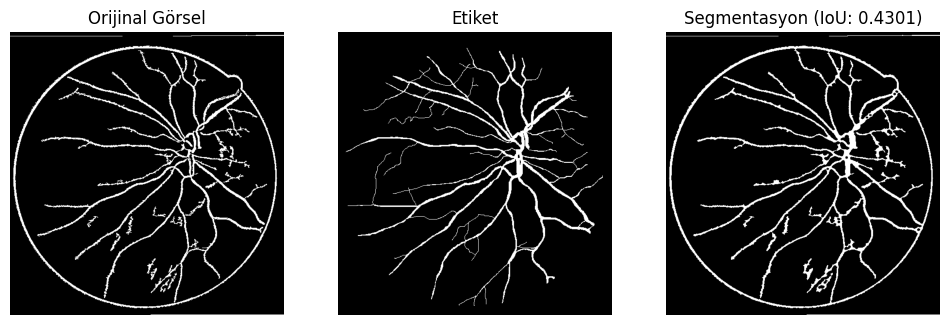

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_32.png - IoU: 0.4644


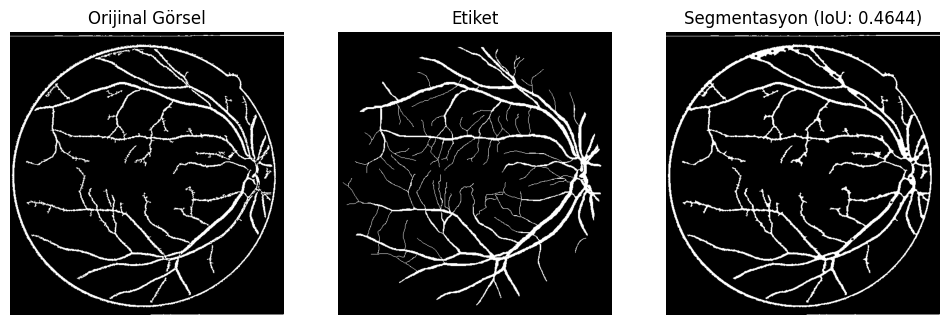

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_33.png - IoU: 0.4778


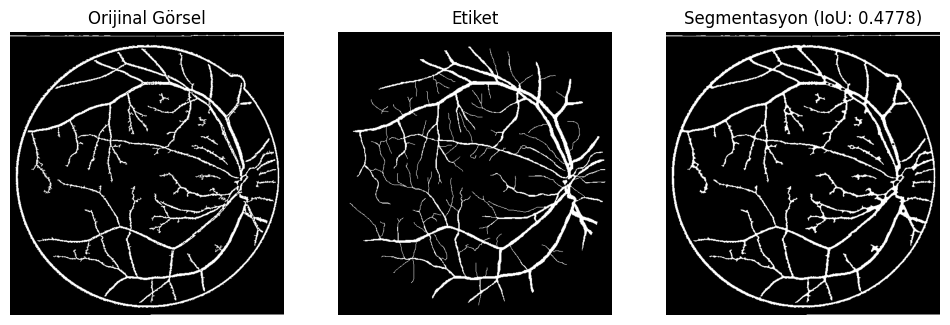

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_35.png - IoU: 0.4871


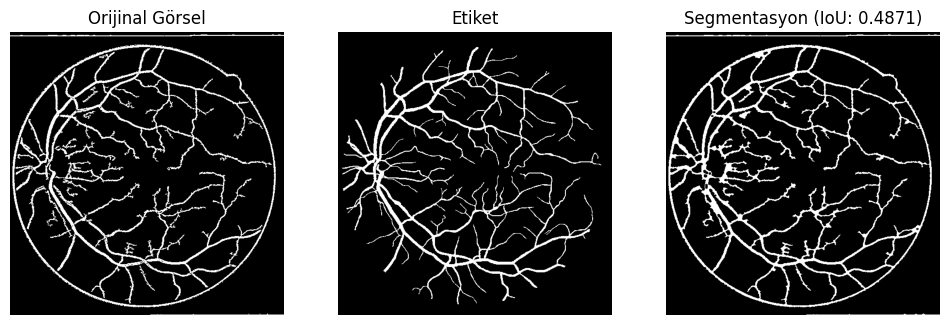

HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_36.png - IoU: 0.4834


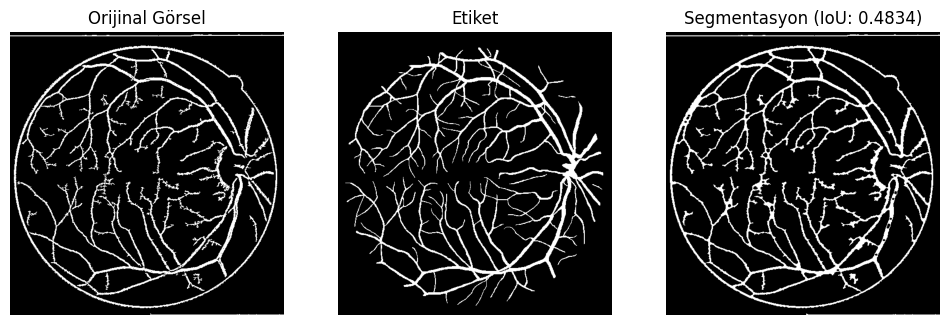

In [13]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

####################################
# 1) 10 Adet Görüntü - Label List #
####################################

# Burada hangi 10 görüntüyü seçeceğinizi 'img_nums' içine yazın.
img_nums = [21,22,24,27,28,31,32,33,35,36]

# Clean_Images klasöründeki orijinal resim yolları:
img_paths = [
    f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
    for n in img_nums
]

# training/vessel klasöründeki label yolları:
test_paths = [
    f"/content/drive/MyDrive/AV_groundTruth/test/images/{n:02d}_test.png"
    for n in img_nums
]

# test/vessel klasöründeki label yolları:
labels_paths = [
    f"/content/drive/MyDrive/AV_groundTruth/training/vessel/{n:02d}_training.png"
    for n in img_nums
]


###############################
# 2) Yardımcı Fonksiyonlar    #
###############################

def extract_hog_features(img):
    """ OpenCV HOGDescriptor ile tek seferde HOG çıkarma. """
    if img.shape[0] < 64 or img.shape[1] < 64:
        img = cv2.resize(img, (64, 128))  # HOG için minimum boyut
    hog = cv2.HOGDescriptor()
    h = hog.compute(img)
    return h

def extract_lbp_features(img, radius=1, n_points=8):
    """ skimage LBP özelliği. """
    lbp = local_binary_pattern(img, n_points, radius, method='uniform')
    return lbp

def apply_gmm(img):
    """ GaussianMixture(2) ile segmentasyon (0/1). """
    flat_img = img.reshape(-1, 1)
    gmm = GaussianMixture(n_components=2, random_state=42)
    gmm.fit(flat_img)
    segmented = gmm.predict(flat_img)
    return segmented.reshape(img.shape)

def calculate_iou(predicted, ground_truth):
    """ IoU hesabı. """
    intersection = np.logical_and(predicted, ground_truth).sum()
    union = np.logical_or(predicted, ground_truth).sum()
    iou = intersection / union if union > 0 else 0
    return iou

###########################
# 3) 10 Görüntüde İşleme  #
###########################
for img_path, label_path in zip(img_paths, labels_paths):
    # 1) Resim ve etiket yükle
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    label = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print(f"Hata: Görüntü yüklenemedi -> {img_path}")
        continue
    if label is None:
        print(f"Hata: Etiket yüklenemedi -> {label_path}")
        continue

    # 2) HOG özellikleri
    try:
        hog_features = extract_hog_features(img)
        print(f"HOG özellikleri çıkarıldı: {hog_features.shape}")
    except Exception as e:
        print(f"HOG çıkarımı sırasında hata oluştu: {e}")
        continue

    # 3) LBP hesapla
    lbp_img = extract_lbp_features(img)
    # 0-1 arası normalizasyonu 0-255'e ölçekle
    lbp_img = (lbp_img / lbp_img.max() * 255).astype(np.uint8)

    # 4) GMM segmentasyonu
    segmented_img = apply_gmm(lbp_img)

    # 5) Segmentasyonu iyileştirme (morfolojik)
    segmented_img = (segmented_img * 255).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    final_segmented = cv2.morphologyEx(segmented_img, cv2.MORPH_CLOSE, kernel)

    # 6) Binary maskeleme
    final_segmented_binary = final_segmented > 127
    label_binary = label > 127

    # 7) IoU
    iou_score = calculate_iou(final_segmented_binary, label_binary)
    print(f"Görsel: {img_path} - IoU: {iou_score:.4f}")

    # 8) Gösterim
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Orijinal Görsel')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(label, cmap='gray')
    plt.title('Etiket')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(final_segmented, cmap='gray')
    plt.title(f'Segmentasyon (IoU: {iou_score:.4f})')
    plt.axis('off')

    plt.show()


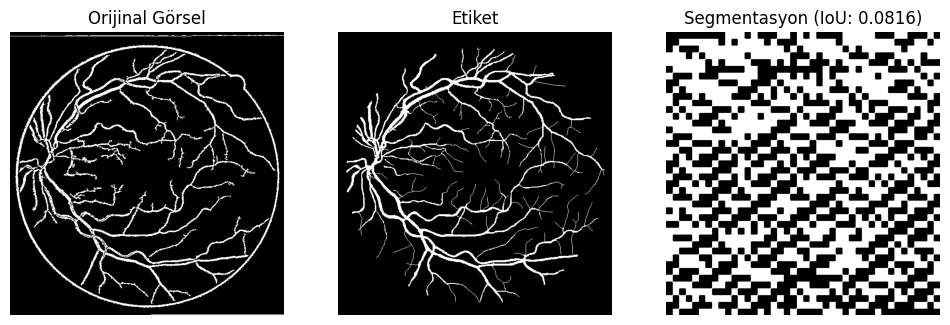

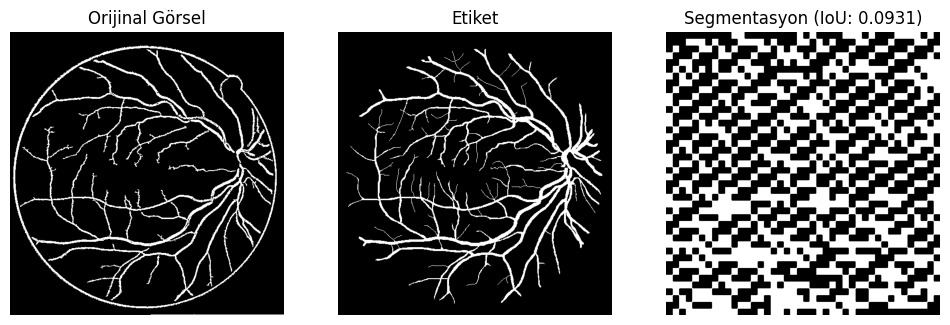

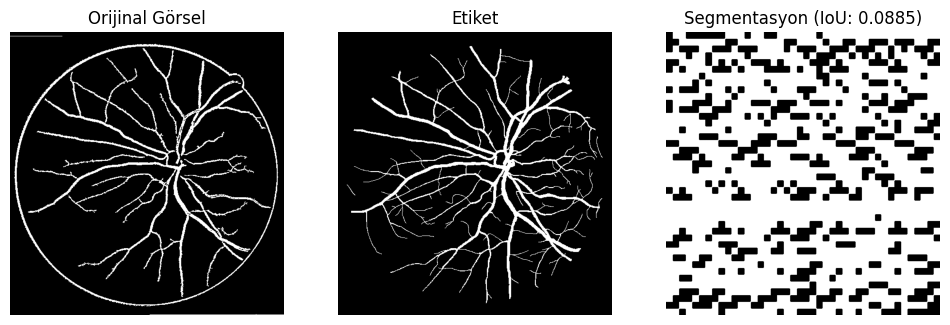

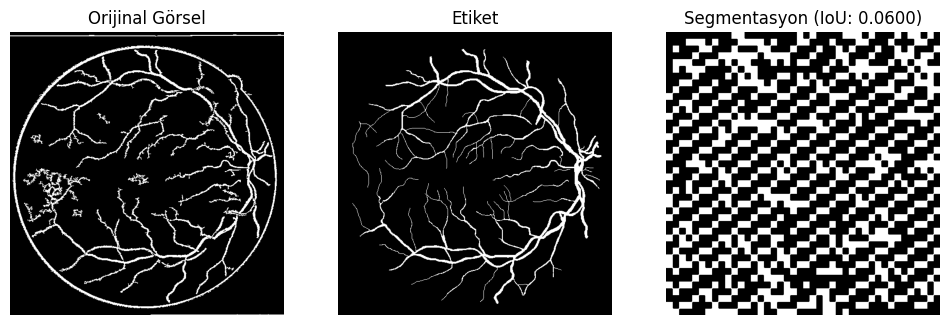

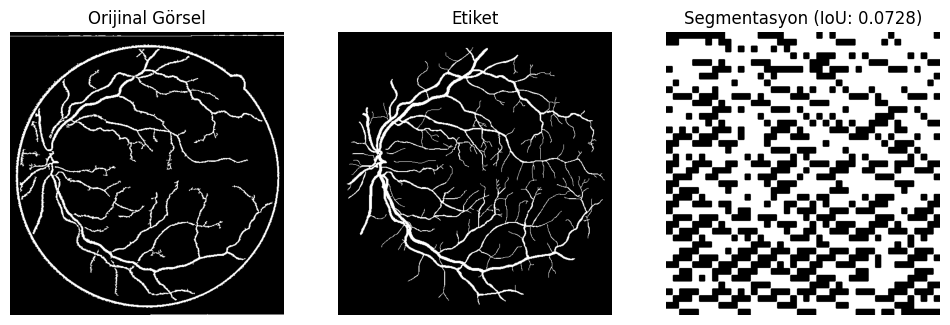

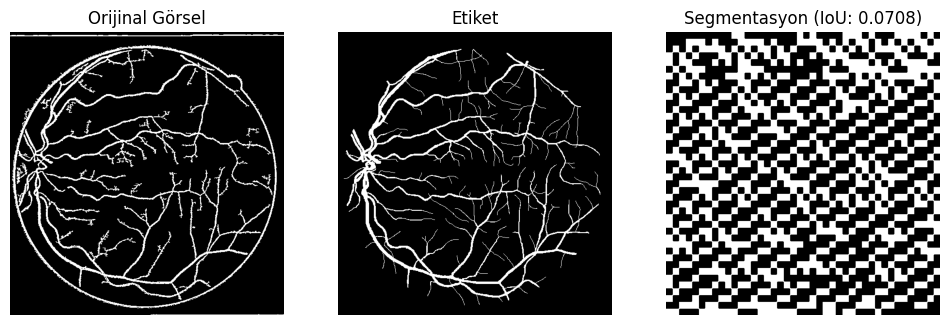

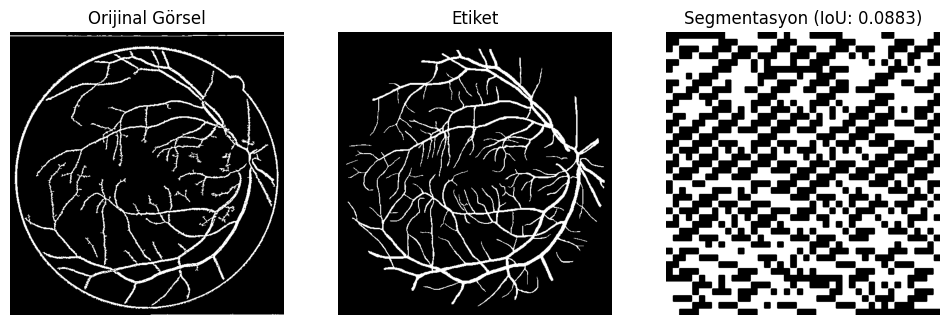

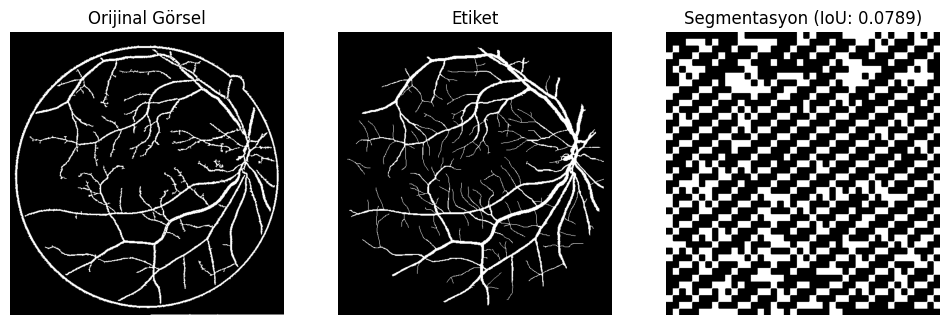

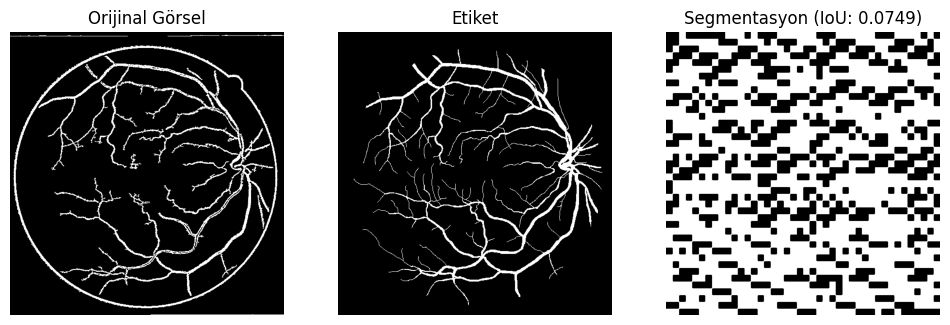

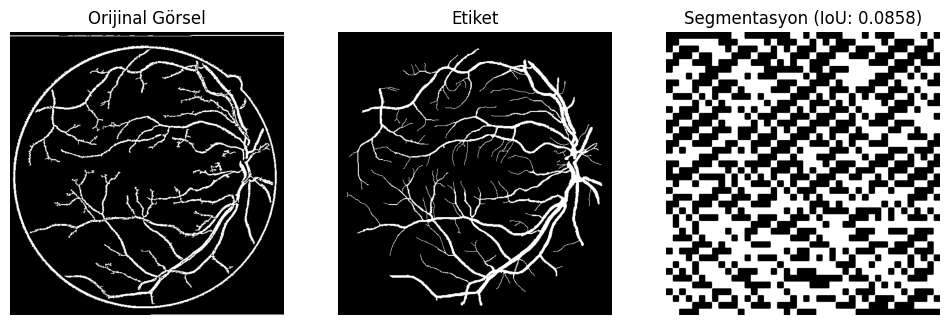

In [ ]:
import cv2
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import os

# Test yolları
test_img_path = '/content/drive/MyDrive/Clean_Images'
test_label_path = '/content/drive/MyDrive/AV_groundTruth/test/vessel'

# HoG Özellik Çıkarımı
def extract_hog_features(img):
    winSize = (64, 64)  # Sabit HoG pencere boyutu
    blockSize = (16, 16)
    blockStride = (8, 8)
    cellSize = (8, 8)
    nbins = 9

    hog = cv2.HOGDescriptor(winSize, blockSize, blockStride, cellSize, nbins)
    img_resized = cv2.resize(img, winSize)  # Görüntüyü sabit boyuta yeniden ölçeklendir
    features = hog.compute(img_resized)
    feature_length = len(features)  # HOG'un vektör uzunluğunu hesapla
    return features, feature_length

# GMM Segmentasyonu
def segment_with_gmm(features, feature_length, img_shape):
    features = features.reshape(-1, 1)
    gmm = GaussianMixture(n_components=2, random_state=42)
    gmm.fit(features)
    segmented = gmm.predict(features)

    # HOG özelliklerini gerçek boyutlarına yeniden şekillendir
    segmented_reshaped = segmented.reshape(int(np.sqrt(feature_length)), int(np.sqrt(feature_length)))

    # Segmentasyonu giriş görüntüsünün boyutlarına ölçekle
    segmented_resized = cv2.resize(segmented_reshaped, (img_shape[1], img_shape[0]), interpolation=cv2.INTER_NEAREST)
    return segmented_resized

# IoU Hesaplama
def calculate_iou(predicted, ground_truth):
    intersection = np.logical_and(predicted, ground_truth).sum()
    union = np.logical_or(predicted, ground_truth).sum()
    return intersection / union if union > 0 else 0

# Görsellerin İşlenmesi
def process_images(img_path, label_path):
    img_files = sorted(os.listdir(img_path))[:10]  # İlk 10 görüntü için işlem yap
    label_files = sorted(os.listdir(label_path))[:10]

    for img_file, label_file in zip(img_files, label_files):
        img = cv2.imread(os.path.join(img_path, img_file), cv2.IMREAD_GRAYSCALE)
        label = cv2.imread(os.path.join(label_path, label_file), cv2.IMREAD_GRAYSCALE)

        if img is None or label is None:
            print(f"HATA: Görüntü veya etiket yüklenemedi -> {img_file}, {label_file}")
            continue

        # HoG Özellik Çıkarımı
        hog_features, feature_length = extract_hog_features(img)

        # GMM Segmentasyonu
        segmented_img = segment_with_gmm(hog_features, feature_length, img.shape)

        # Morfolojik İyileştirme
        segmented_img = (segmented_img * 255).astype(np.uint8)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        final_segmented = cv2.morphologyEx(segmented_img, cv2.MORPH_CLOSE, kernel)

        # IoU Hesaplama
        iou_score = calculate_iou(final_segmented > 127, label > 127)

        # Görselleştirme
        plt.figure(figsize=(12, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(img, cmap='gray')
        plt.title('Orijinal Görsel')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(label, cmap='gray')
        plt.title('Etiket')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(final_segmented, cmap='gray')
        plt.title(f'Segmentasyon (IoU: {iou_score:.4f})')
        plt.axis('off')
        plt.show()

# Test Görsellerini İşle
process_images(test_img_path, test_label_path)


Eğitim verileri yükleniyor ve HOG öznitelikleri çıkarılıyor...
Hata: /content/drive/MyDrive/Clean_Images/clean_image_13.png veya /content/drive/MyDrive/AV_groundTruth/training/vessel/13_training.png yüklenemedi.
Hata: /content/drive/MyDrive/Clean_Images/clean_image_16.png veya /content/drive/MyDrive/AV_groundTruth/training/vessel/16_training.png yüklenemedi.
Eğitim verisinden elde edilen özellik matrisi boyutu: (989880, 36)
Label boyutu: (989880,)
GMM eğitimi başlıyor (2 cluster)...
GMM eğitimi tamamlandı.
Vessel cluster ID = 1 (GMM)

=== TEST AŞAMASI ===
[Test 1] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_01.png - IoU: 0.1456


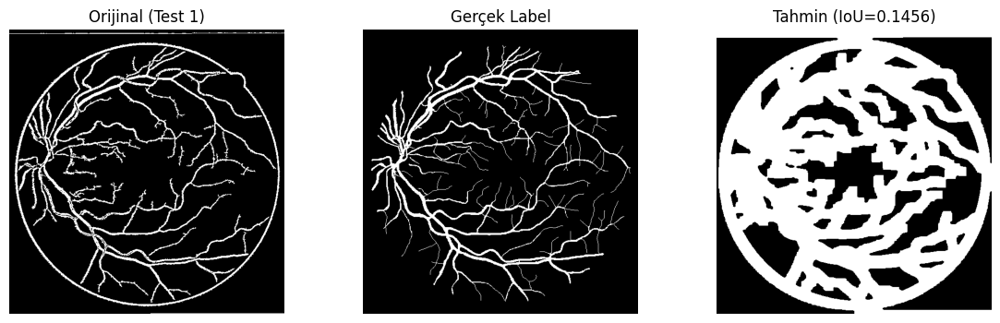

[Test 2] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_02.png - IoU: 0.1824


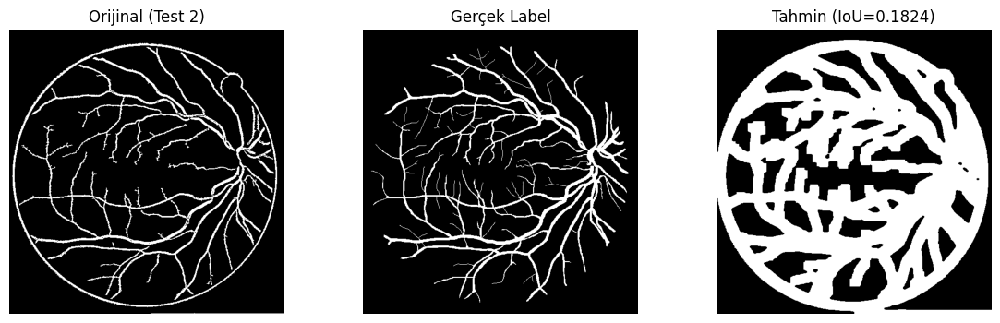

[Test 3] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_04.png - IoU: 0.1654


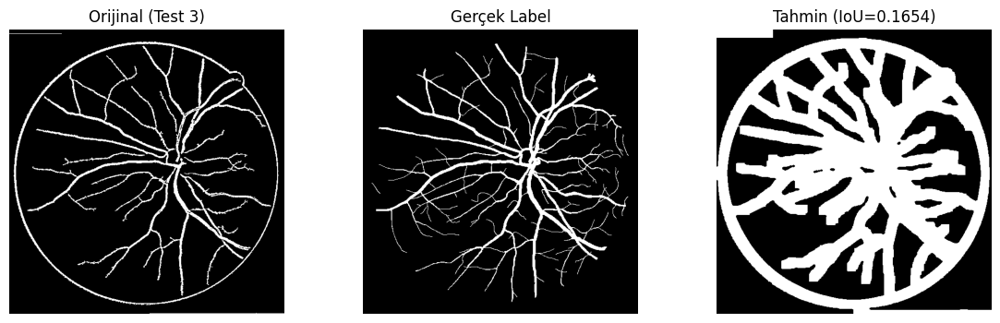

[Test 4] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_08.png - IoU: 0.1142


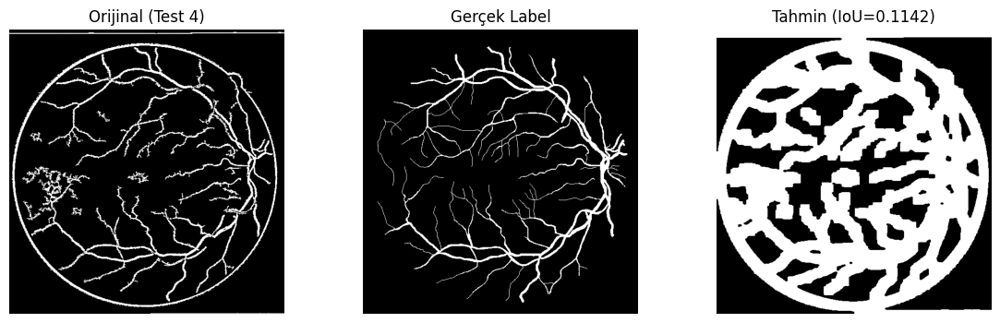

[Test 5] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_09.png - IoU: 0.1382


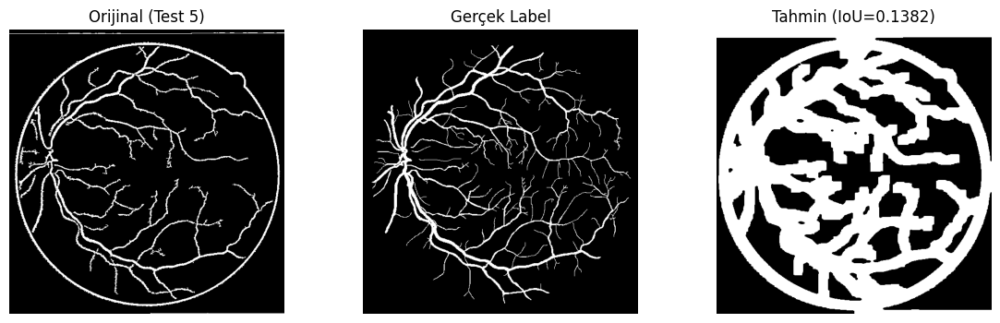

[Test 6] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_11.png - IoU: 0.1349


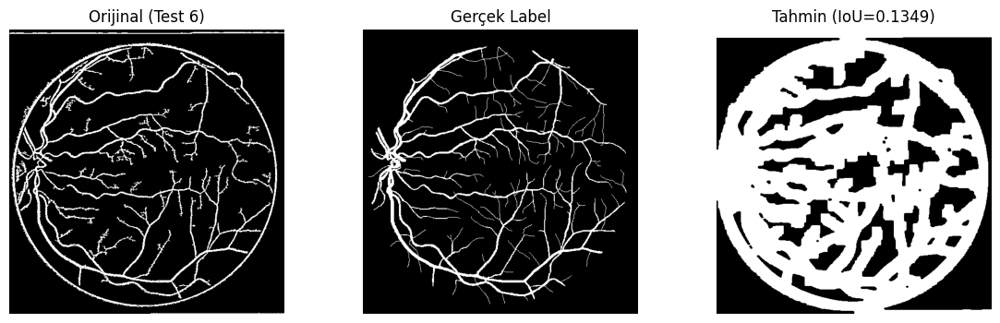

[Test 7] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_17.png - IoU: 0.1362


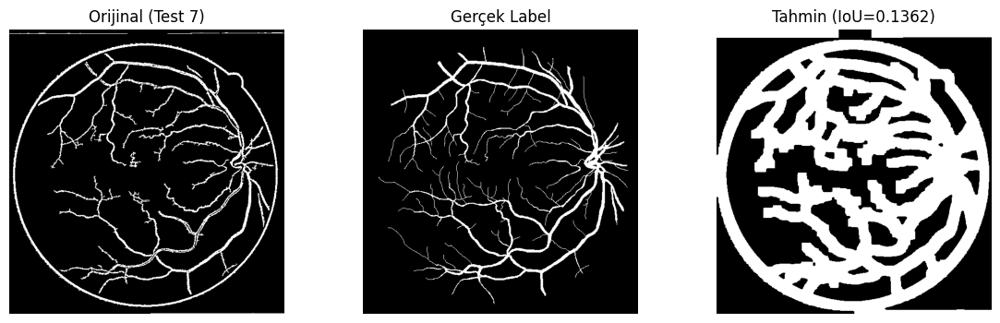

[Test 8] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_18.png - IoU: 0.1578


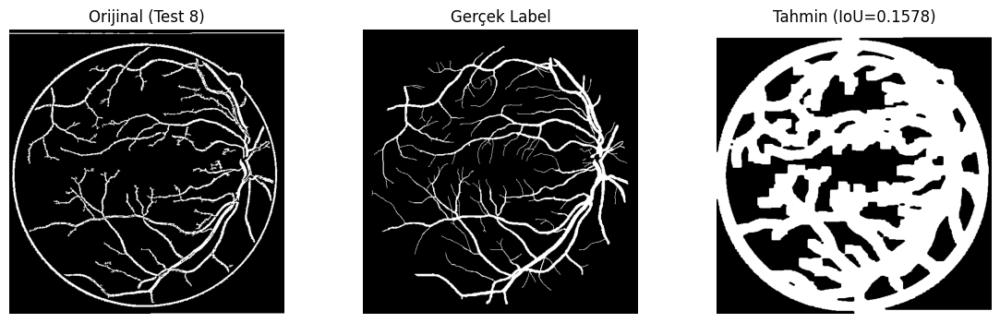

Hata: /content/drive/MyDrive/Clean_Images/clean_image_21.png veya /content/drive/MyDrive/AV_groundTruth/test/vessel/21_test.png yüklenemedi.
Hata: /content/drive/MyDrive/Clean_Images/clean_image_27.png veya /content/drive/MyDrive/AV_groundTruth/test/vessel/27_test.png yüklenemedi.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from skimage.feature import hog

############################
# 1) Yardımcı Fonksiyonlar #
############################

def extract_hog_patch(img_gray, x, y, patch_size=16):
    """
    img_gray   : Gri seviyeli görüntü (numpy array).
    (x, y)     : Yamayı merkezleyeceğimiz piksel konumu.
    patch_size : Yamada kullanılacak kenar uzunluğu (kare yama).

    Dönüş      : Tek boyutlu HOG feature vektörü (örn. 3780 boyutlu).
    """
    half = patch_size // 2
    # Kenarlarda taşmamak için min/max
    x1 = max(0, x - half)
    y1 = max(0, y - half)
    x2 = min(img_gray.shape[0], x + half)
    y2 = min(img_gray.shape[1], y + half)

    patch = img_gray[x1:x2, y1:y2]
    # HOG hesaplamak için patch'i sabit boyuta (patch_size x patch_size) getirelim
    patch_resized = cv2.resize(patch, (patch_size, patch_size))

    # skimage.feature.hog kullanımı
    # Burada cell_size, block_size vb. parametreler ayarlanabilir
    features = hog(patch_resized,
                   orientations=9,
                   pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2),
                   block_norm='L2-Hys',
                   visualize=False,
                   transform_sqrt=True)
    return features


def calculate_iou(pred_mask, gt_mask):
    """
    pred_mask : Tahmin maskesi (0/1).
    gt_mask   : Gerçek (label) maskesi (0/1).
    """
    intersection = np.logical_and(pred_mask == 1, gt_mask == 1).sum()
    union = np.logical_or(pred_mask == 1, gt_mask == 1).sum()
    iou = intersection / union if union > 0 else 0
    return iou


############################
# 2) Eğitim Veri Listeleri #
############################
# Örnek olsun diye 5 tane training, 10 tane test listesi oluşturuyoruz.
# Siz kendi dataset numaralarınıza göre ayarlayınız.
train_image_nums = [21, 27, 32, 13, 16]  # Örnek
test_image_nums  = [1, 2, 4, 8, 9, 11, 17, 18, 21, 27]  # 10 test resmi

train_image_list = [f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
                    for n in train_image_nums]
train_label_list = [f"/content/drive/MyDrive/AV_groundTruth/training/vessel/{n:02d}_training.png"
                    for n in train_image_nums]

test_image_list  = [f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
                    for n in test_image_nums]
test_label_list  = [f"/content/drive/MyDrive/AV_groundTruth/test/vessel/{n:02d}_test.png"
                    for n in test_image_nums]


###########################################
# 3) Eğitim Aşaması: HOG + GMM (2 cluster) #
###########################################
# Not: Tümüyle gözetimsiz isterseniz, label'ı sadece cluster-ların hangi sınıfa
#      denk geldiğini bulmak için kullanabilirsiniz. Veya label'ları
#      GMM eğitimine katmayıp sadece 2 bileşene ayırın, sonra cluster->damar
#      eşlemesini (intersection en büyük olan) bulabilirsiniz.

all_features = []
all_labels   = []  # 0 veya 1 (damar değil / damar)

patch_size = 16  # HOG yaması

print("Eğitim verileri yükleniyor ve HOG öznitelikleri çıkarılıyor...")
for img_path, lbl_path in zip(train_image_list, train_label_list):
    # Görüntüleri oku
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

    if img is None or lbl is None:
        print(f"Hata: {img_path} veya {lbl_path} yüklenemedi.")
        continue

    # Label'i ikili maske yapalım (0-1):
    lbl_binary = (lbl > 127).astype(np.uint8)

    # Tüm pikselleri gezip HOG feature toplayalım (yavaş!)
    # (İsterseniz sadece damar bölgelerinden ve bir miktar arkaplandan örnek de alabilirsiniz)
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            feat = extract_hog_patch(img, x, y, patch_size=patch_size)
            all_features.append(feat)
            all_labels.append(lbl_binary[x, y])

# NumPy array'e dönüştür
all_features = np.array(all_features, dtype=np.float32)
all_labels   = np.array(all_labels,   dtype=np.uint8)

print("Eğitim verisinden elde edilen özellik matrisi boyutu:", all_features.shape)
print("Label boyutu:", all_labels.shape)

# Şimdi 2 bileşenli (damar / damar değil) bir GMM eğitelim:
print("GMM eğitimi başlıyor (2 cluster)...")
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(all_features)
print("GMM eğitimi tamamlandı.")

# Hangi cluster damar, hangisi damar değil bulmak için:
cluster_labels = gmm.predict(all_features)  # 0 veya 1 cluster
# Her cluster’ın gerçekte damar (1) pikseliyle ne kadar çakıştığını bulalım
is_cluster_0_vessel = np.sum((cluster_labels == 0) & (all_labels == 1))
is_cluster_1_vessel = np.sum((cluster_labels == 1) & (all_labels == 1))
# Hangisi büyük ise o cluster'ı "damar" olarak etiketliyoruz
if is_cluster_0_vessel > is_cluster_1_vessel:
    vessel_cluster = 0
else:
    vessel_cluster = 1

print(f"Vessel cluster ID = {vessel_cluster} (GMM)")


#############################
# 4) Test Aşaması ve IoU    #
#############################
# 10 farklı test görüntüsünde segmentasyon yap ve IoU'yu raporla
print("\n=== TEST AŞAMASI ===")

for idx, (img_path, lbl_path) in enumerate(zip(test_image_list, test_label_list)):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

    if img is None or lbl is None:
        print(f"Hata: {img_path} veya {lbl_path} yüklenemedi.")
        continue

    # Test için her piksel HOG feature
    test_feats = []
    coords = []  # Sonradan mask oluşturmak için x,y tutacağız
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            feat = extract_hog_patch(img, x, y, patch_size=patch_size)
            test_feats.append(feat)
            coords.append((x, y))
    test_feats = np.array(test_feats, dtype=np.float32)

    # GMM tahmini
    cluster_pred = gmm.predict(test_feats)
    # vessel_cluster hangisiyse damar = 1
    pred_mask = (cluster_pred == vessel_cluster).astype(np.uint8)

    # pred_mask tek boyutlu; bunu tekrar orijinal boyuta yerleştirelim
    vessel_pred = np.zeros_like(img, dtype=np.uint8)
    for (x, y), val in zip(coords, pred_mask):
        vessel_pred[x, y] = val

    # Ufak bir morfolojik açma/kapama ile iyileştirme
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    vessel_pred = cv2.morphologyEx(vessel_pred, cv2.MORPH_CLOSE, kernel)

    # Label binary
    lbl_binary = (lbl > 127).astype(np.uint8)

    # IoU hesaplama
    iou_score = calculate_iou(vessel_pred, lbl_binary)

    # Sonuçları yazdır
    print(f"[Test {idx+1}] Görsel: {img_path} - IoU: {iou_score:.4f}")

    # Matplotlib ile görselleştirelim
    plt.figure(figsize=(14, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Orijinal (Test {idx+1})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(lbl, cmap='gray')
    plt.title("Gerçek Label")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(vessel_pred, cmap='gray')
    plt.title(f"Tahmin (IoU={iou_score:.4f})")
    plt.axis('off')

    plt.show()


Eğitim verileri yükleniyor ve HOG öznitelikleri çıkarılıyor...
Hata: /content/drive/MyDrive/Clean_Images/clean_image_13.png veya /content/drive/MyDrive/AV_groundTruth/training/vessel/13_training.png yüklenemedi.
Hata: /content/drive/MyDrive/Clean_Images/clean_image_16.png veya /content/drive/MyDrive/AV_groundTruth/training/vessel/16_training.png yüklenemedi.
Eğitim verisinden elde edilen özellik boyutu: (989880, 9)
Label boyutu: (989880,)
GMM (2 cluster) eğitiliyor...
GMM eğitimi tamamlandı.
Vessel cluster ID = 1

=== TEST AŞAMASI ===
[Test 1] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_01.png - IoU: 0.2216


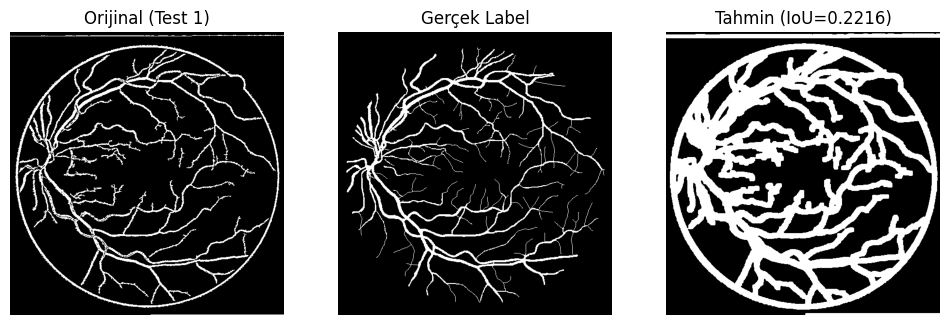

[Test 2] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_02.png - IoU: 0.2817


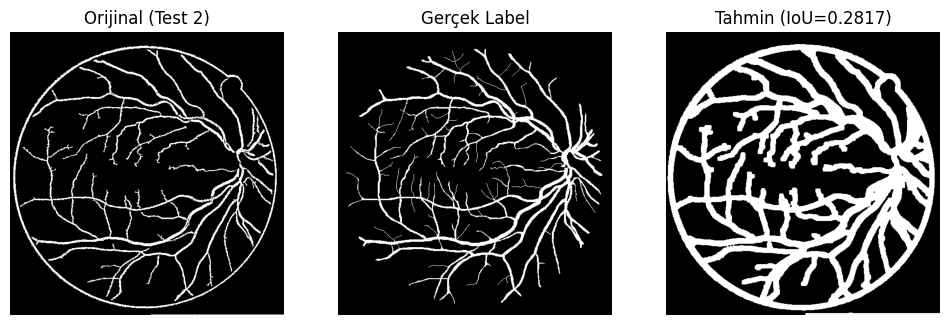

[Test 3] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_04.png - IoU: 0.2581


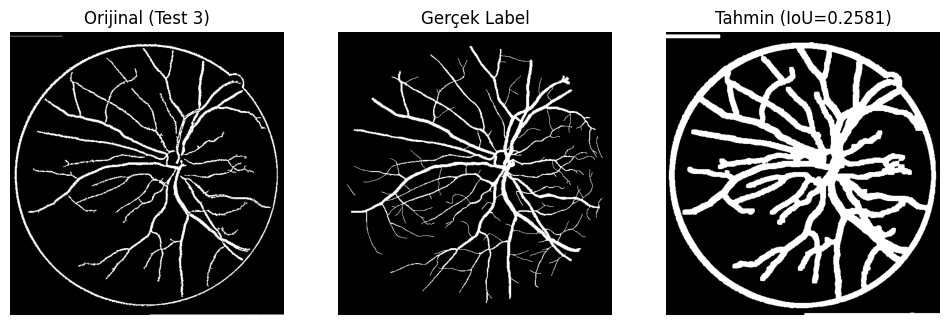

[Test 4] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_08.png - IoU: 0.1766


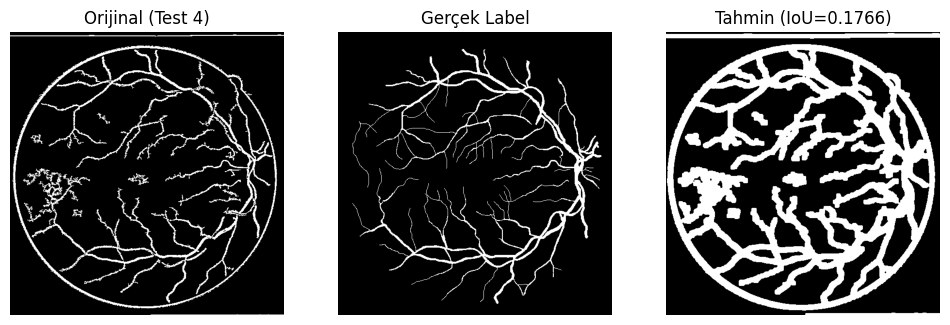

[Test 5] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_09.png - IoU: 0.2117


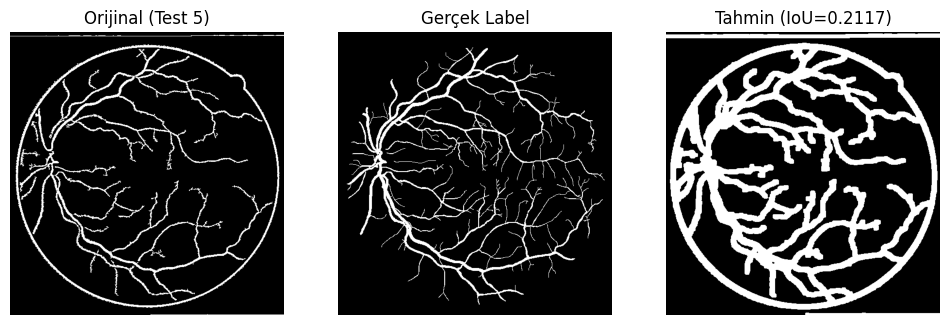

[Test 6] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_11.png - IoU: 0.2049


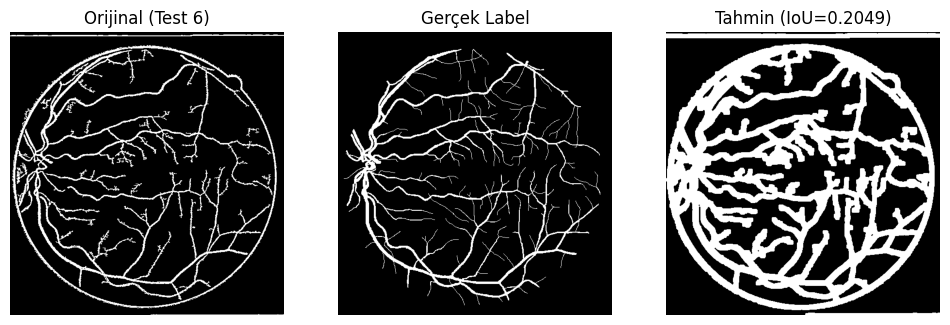

[Test 7] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_17.png - IoU: 0.2140


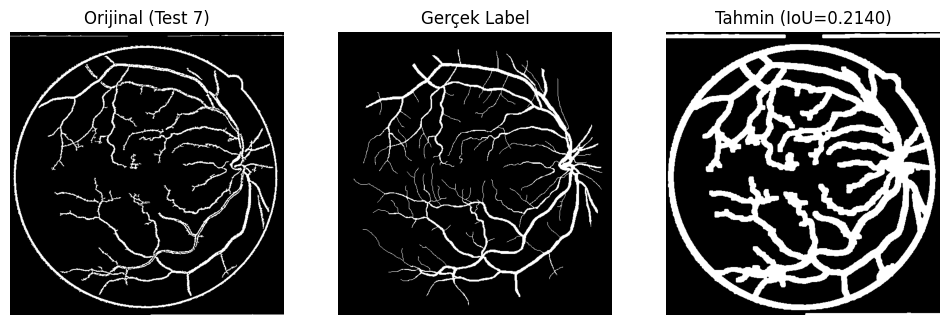

[Test 8] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_18.png - IoU: 0.2437


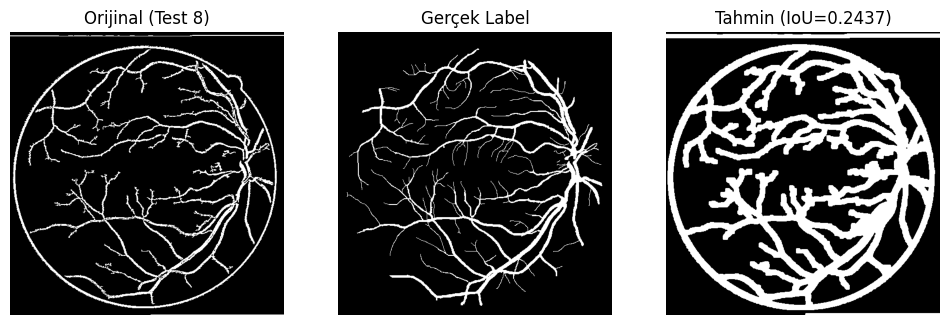

Hata: /content/drive/MyDrive/Clean_Images/clean_image_21.png veya /content/drive/MyDrive/AV_groundTruth/test/vessel/21_test.png yüklenemedi.
Hata: /content/drive/MyDrive/Clean_Images/clean_image_27.png veya /content/drive/MyDrive/AV_groundTruth/test/vessel/27_test.png yüklenemedi.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage.morphology import skeletonize
from sklearn.mixture import GaussianMixture

##############################
# 1) Parametre ve Fonksiyon #
##############################

PATCH_SIZE = 8  # HOG için daha küçük yama
THRESHOLD  = 0.5  # GMM olasılık eşiği

def extract_hog_patch(img_gray, x, y, patch_size=8):
    """
    Piksel (x,y) etrafındaki yamadan HOG özelliği.
    """
    half = patch_size // 2
    x1 = max(0, x - half)
    y1 = max(0, y - half)
    x2 = min(img_gray.shape[0], x + half)
    y2 = min(img_gray.shape[1], y + half)

    patch = img_gray[x1:x2, y1:y2]
    patch_resized = cv2.resize(patch, (patch_size, patch_size))

    features = hog(
        patch_resized,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(1, 1),
        block_norm='L2-Hys',
        visualize=False,
        transform_sqrt=True
    )
    return features

def calculate_iou(pred_mask, gt_mask):
    """
    pred_mask : 0/1 tahmin
    gt_mask   : 0/1 gerçek
    """
    intersection = np.logical_and(pred_mask == 1, gt_mask == 1).sum()
    union        = np.logical_or(pred_mask == 1,  gt_mask == 1).sum()
    iou = intersection / union if union > 0 else 0
    return iou

def refine_mask(binary_mask):
    """
    1) Açma (OPEN) => ince dallarda gürültüyü temizler
    2) Kapama (CLOSE) => damar içindeki boşlukları kapatır
    Kernel = 3x3 ELLIPSE
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    # Açma
    opened = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    # Kapama
    closed = cv2.morphologyEx(opened, cv2.MORPH_CLOSE, kernel)
    return closed

#########################
# 2) Veri Yolları List #
#########################
# Burayı KENDİ dataset numaralarınıza göre düzenleyin.
train_image_nums = [21, 27, 32, 13, 16]  # Örnek: training
test_image_nums  = [1, 2, 4, 8, 9, 11, 17, 18, 21, 27]  # Örnek: test

train_image_list = [f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
                    for n in train_image_nums]
train_label_list = [f"/content/drive/MyDrive/AV_groundTruth/training/vessel/{n:02d}_training.png"
                    for n in train_image_nums]

test_image_list  = [f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
                    for n in test_image_nums]
test_label_list  = [f"/content/drive/MyDrive/AV_groundTruth/test/vessel/{n:02d}_test.png"
                    for n in test_image_nums]

########################################
# 3) Eğitim Aşaması: HOG + GMM (2 cls) #
########################################

all_features = []
all_labels   = []

print("Eğitim verileri yükleniyor ve HOG öznitelikleri çıkarılıyor...")
for img_path, lbl_path in zip(train_image_list, train_label_list):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

    if img is None or lbl is None:
        print(f"Hata: {img_path} veya {lbl_path} yüklenemedi.")
        continue

    lbl_bin = (lbl > 127).astype(np.uint8)
    h, w = img.shape

    # Her piksel için HOG
    for x in range(h):
        for y in range(w):
            feat = extract_hog_patch(img, x, y, PATCH_SIZE)
            all_features.append(feat)
            all_labels.append(lbl_bin[x, y])

all_features = np.array(all_features, dtype=np.float32)
all_labels   = np.array(all_labels,   dtype=np.uint8)

print("Eğitim verisinden elde edilen özellik boyutu:", all_features.shape)
print("Label boyutu:", all_labels.shape)

# GMM eğitimi
print("GMM (2 cluster) eğitiliyor...")
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(all_features)
print("GMM eğitimi tamamlandı.")

# Hangi cluster damar?
gmm_labels = gmm.predict(all_features)
cnt_clus0_vessel = np.sum((gmm_labels == 0) & (all_labels == 1))
cnt_clus1_vessel = np.sum((gmm_labels == 1) & (all_labels == 1))
if cnt_clus0_vessel >= cnt_clus1_vessel:
    vessel_cluster = 0
else:
    vessel_cluster = 1

print(f"Vessel cluster ID = {vessel_cluster}")

#############################
# 4) Test Aşaması ve IoU    #
#############################

print("\n=== TEST AŞAMASI ===")
for idx, (img_path, lbl_path) in enumerate(zip(test_image_list, test_label_list), start=1):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

    if img is None or lbl is None:
        print(f"Hata: {img_path} veya {lbl_path} yüklenemedi.")
        continue

    lbl_bin = (lbl > 127).astype(np.uint8)
    h, w = img.shape

    # Test için HOG çıkar (pikseller bazında)
    test_feats = []
    coords = []
    for x in range(h):
        for y in range(w):
            feat = extract_hog_patch(img, x, y, PATCH_SIZE)
            test_feats.append(feat)
            coords.append((x, y))
    test_feats = np.array(test_feats, dtype=np.float32)

    # GMM olasılık tahmini (predict_proba)
    probs = gmm.predict_proba(test_feats)
    vessel_probs = probs[:, vessel_cluster]  # Damara ait cluster olasılığı

    # Olasılık eşiği (THRESHOLD)
    pred_1d = (vessel_probs >= THRESHOLD).astype(np.uint8)

    # 2D maske
    vessel_pred = np.zeros((h, w), dtype=np.uint8)
    for (x, y), val in zip(coords, pred_1d):
        vessel_pred[x, y] = val

    # Morfolojik açma + kapama ile inceltme ve delik kapama
    vessel_refined = refine_mask(vessel_pred)

    # (İSTEĞE BAĞLI) Skeletonize
    # vessel_skel = skeletonize(vessel_refined > 0).astype(np.uint8)
    # iou_score = calculate_iou(vessel_skel, lbl_bin)

    # Şimdilik skeleton yerine refined maske ile IoU:
    iou_score = calculate_iou(vessel_refined, lbl_bin)

    # Rapor
    print(f"[Test {idx}] Görsel: {img_path} - IoU: {iou_score:.4f}")

    # Plot
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Orijinal (Test {idx})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(lbl, cmap='gray')
    plt.title("Gerçek Label")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(vessel_refined, cmap='gray')
    plt.title(f"Tahmin (IoU={iou_score:.4f})")
    plt.axis('off')

    plt.show()


Eğitim verileri yükleniyor ve HOG çıkarılıyor...
Hata: /content/drive/MyDrive/Clean_Images/clean_image_13.png veya /content/drive/MyDrive/AV_groundTruth/training/vessel/13_training.png yüklenemedi!
Hata: /content/drive/MyDrive/Clean_Images/clean_image_16.png veya /content/drive/MyDrive/AV_groundTruth/training/vessel/16_training.png yüklenemedi!
Eğitim feature matrisi boyutu: (989880, 9)
Label boyutu: (989880,)
GMM (2 cluster) eğitimi başlıyor...
GMM eğitimi tamamlandı.
Vessel cluster ID = 1

=== TEST AŞAMASI ===
[Test 1] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_01.png - IoU = 0.1278


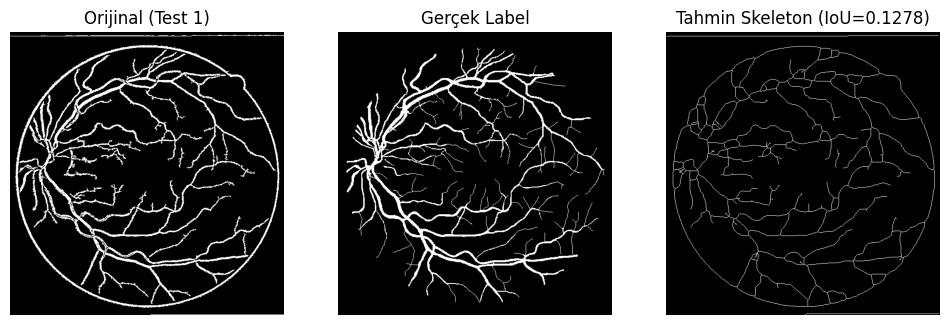

[Test 2] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_02.png - IoU = 0.1384


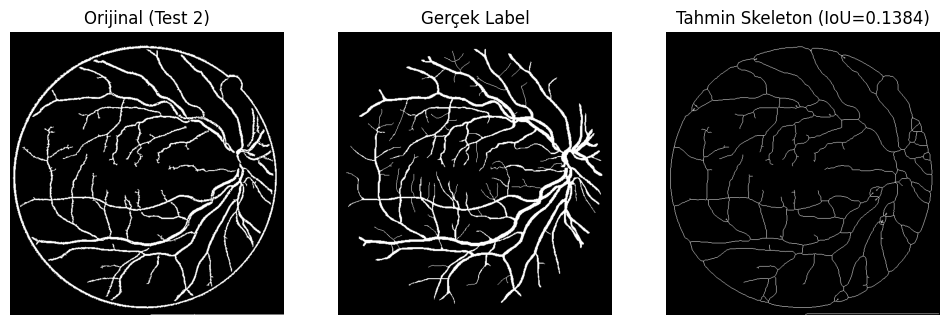

[Test 3] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_04.png - IoU = 0.1398


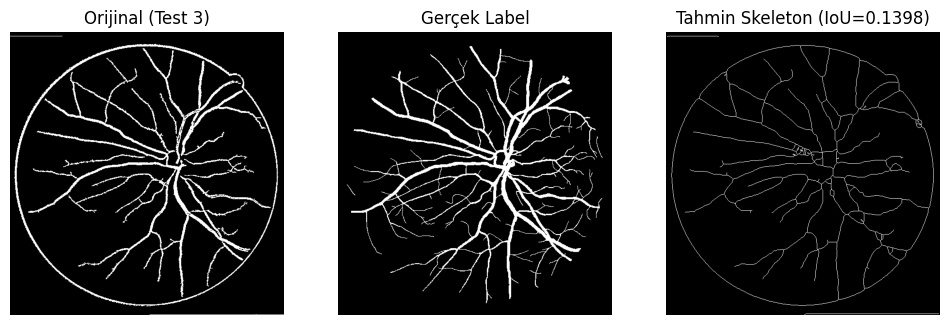

[Test 4] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_08.png - IoU = 0.1298


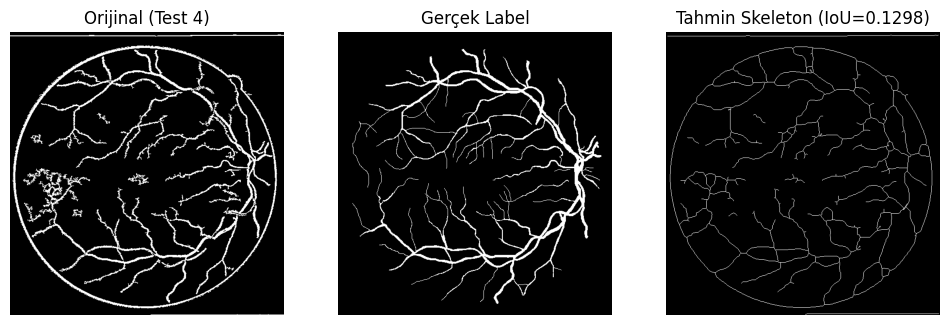

[Test 5] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_09.png - IoU = 0.1382


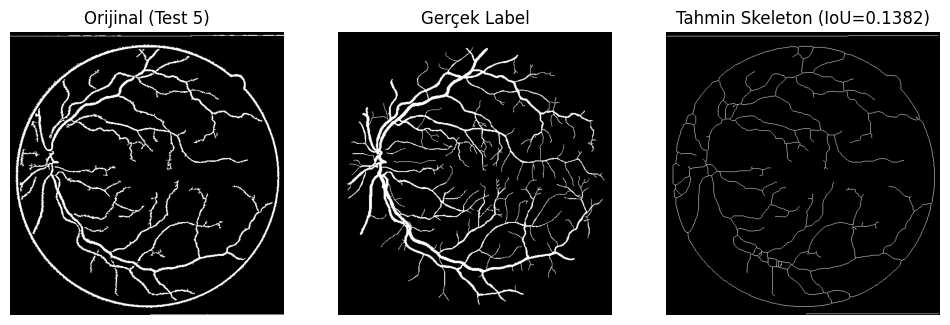

[Test 6] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_11.png - IoU = 0.1404


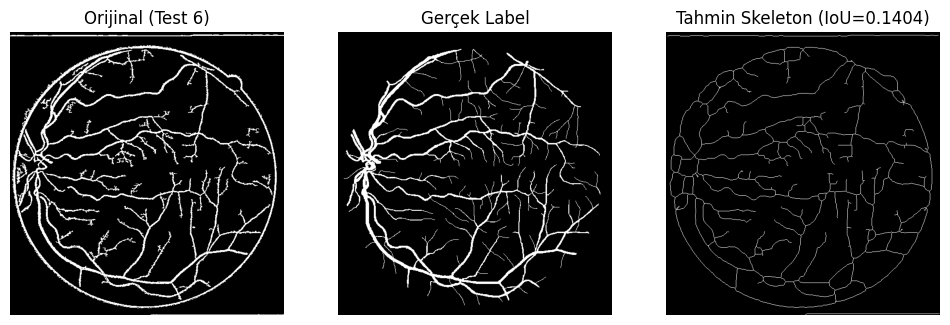

[Test 7] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_17.png - IoU = 0.1384


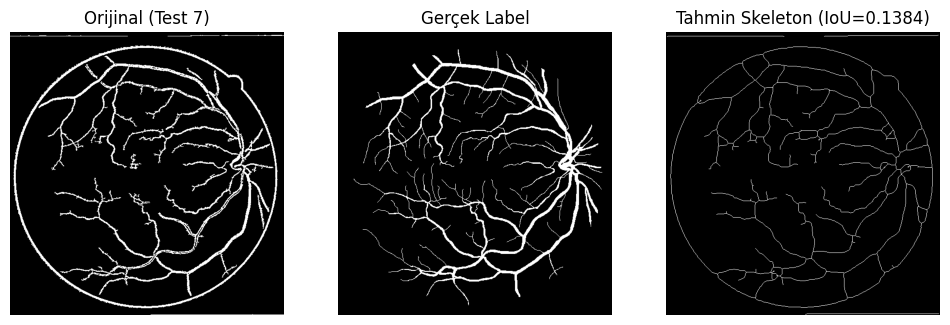

[Test 8] Görsel: /content/drive/MyDrive/Clean_Images/clean_image_18.png - IoU = 0.1283


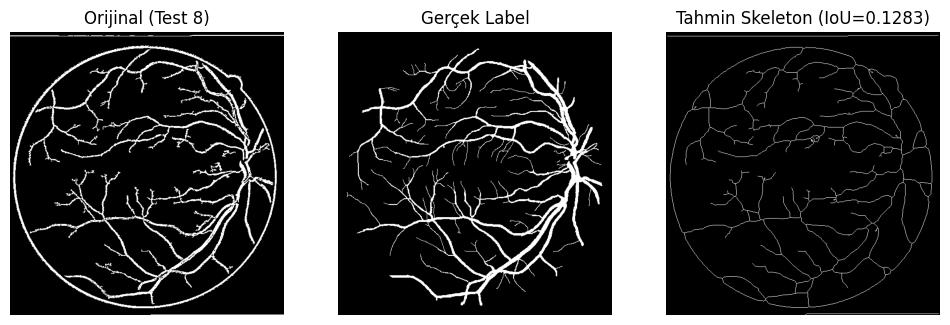

Hata: /content/drive/MyDrive/Clean_Images/clean_image_21.png veya /content/drive/MyDrive/AV_groundTruth/test/vessel/21_test.png yüklenemedi!
Hata: /content/drive/MyDrive/Clean_Images/clean_image_27.png veya /content/drive/MyDrive/AV_groundTruth/test/vessel/27_test.png yüklenemedi!


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage.morphology import skeletonize
from sklearn.mixture import GaussianMixture

############################
# 1) PARAMETRELER & FONK.  #
############################

PATCH_SIZE = 8      # Küçük HOG yaması: İnce detay için
THRESHOLD  = 0.45   # GMM olasılık eşiği (düşük => daha fazla damar, yüksek => daha az ama ince)
USE_SKELETON = True # True ise skeletonize uygular

def extract_hog_patch(img_gray, x, y, patch_size=8):
    """
    Piksel (x, y) etrafındaki 'patch_size x patch_size' yama için HOG çıkarır.
    """
    from skimage.feature import hog

    half = patch_size // 2
    x1 = max(0, x - half)
    y1 = max(0, y - half)
    x2 = min(img_gray.shape[0], x + half)
    y2 = min(img_gray.shape[1], y + half)

    patch = img_gray[x1:x2, y1:y2]
    patch_resized = cv2.resize(patch, (patch_size, patch_size))

    features = hog(patch_resized,
                   orientations=9,
                   pixels_per_cell=(8, 8),
                   cells_per_block=(1, 1),
                   block_norm='L2-Hys',
                   visualize=False,
                   transform_sqrt=True)
    return features

def calculate_iou(pred_mask, gt_mask):
    """
    pred_mask : 0/1 tahmin
    gt_mask   : 0/1 gerçek label
    """
    intersection = np.logical_and(pred_mask == 1, gt_mask == 1).sum()
    union        = np.logical_or(pred_mask == 1,  gt_mask == 1).sum()
    return (intersection / union) if union > 0 else 0

def morph_open(binary_mask, ksize=3):
    """
    Morfolojik 'open' (açma) işlemi: ince gürültüyü temizler, damarları biraz inceltir.
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
    opened = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    return opened

#########################
# 2) VERİ YOLLARI       #
#########################
# Lütfen burayı kendi dataset'inize göre ayarlayın.
train_image_nums = [21, 27, 32, 13, 16]  # Örnek, training verisi
test_image_nums  = [1, 2, 4, 8, 9, 11, 17, 18, 21, 27]  # Örnek, test verisi

train_image_list = [
    f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
    for n in train_image_nums
]
train_label_list = [
    f"/content/drive/MyDrive/AV_groundTruth/training/vessel/{n:02d}_training.png"
    for n in train_image_nums
]

test_image_list = [
    f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
    for n in test_image_nums
]
test_label_list = [
    f"/content/drive/MyDrive/AV_groundTruth/test/vessel/{n:02d}_test.png"
    for n in test_image_nums
]

############################################
# 3) EĞİTİM AŞAMASI: HOG + GMM (2 Clusters) #
############################################
all_features = []
all_labels   = []

print("Eğitim verileri yükleniyor ve HOG çıkarılıyor...")
for img_path, lbl_path in zip(train_image_list, train_label_list):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

    if img is None or lbl is None:
        print(f"Hata: {img_path} veya {lbl_path} yüklenemedi!")
        continue

    lbl_bin = (lbl > 127).astype(np.uint8)
    h, w = img.shape

    for x in range(h):
        for y in range(w):
            feat = extract_hog_patch(img, x, y, PATCH_SIZE)
            all_features.append(feat)
            all_labels.append(lbl_bin[x, y])

all_features = np.array(all_features, dtype=np.float32)
all_labels   = np.array(all_labels,   dtype=np.uint8)

print("Eğitim feature matrisi boyutu:", all_features.shape)
print("Label boyutu:", all_labels.shape)

print("GMM (2 cluster) eğitimi başlıyor...")
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(all_features)
print("GMM eğitimi tamamlandı.")

# Hangi cluster damar?
gmm_labels = gmm.predict(all_features)
cnt_0_vessel = np.sum((gmm_labels == 0) & (all_labels == 1))
cnt_1_vessel = np.sum((gmm_labels == 1) & (all_labels == 1))
if cnt_0_vessel >= cnt_1_vessel:
    vessel_cluster = 0
else:
    vessel_cluster = 1

print(f"Vessel cluster ID = {vessel_cluster}")

###########################
# 4) TEST VE GÖRSELLEŞTİR #
###########################
print("\n=== TEST AŞAMASI ===")

for idx, (img_path, lbl_path) in enumerate(zip(test_image_list, test_label_list), start=1):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

    if img is None or lbl is None:
        print(f"Hata: {img_path} veya {lbl_path} yüklenemedi!")
        continue

    lbl_bin = (lbl > 127).astype(np.uint8)
    h, w = img.shape

    # Testte HOG özellik çıkarma
    test_feats = []
    coords     = []
    for x in range(h):
        for y in range(w):
            feat = extract_hog_patch(img, x, y, PATCH_SIZE)
            test_feats.append(feat)
            coords.append((x, y))
    test_feats = np.array(test_feats, dtype=np.float32)

    # GMM olasılık tahmini (predict_proba)
    probs = gmm.predict_proba(test_feats)
    vessel_probs = probs[:, vessel_cluster]

    # Eşik üstü damar (0 veya 1)
    pred_1d = (vessel_probs >= THRESHOLD).astype(np.uint8)

    # 2D maske
    vessel_pred = np.zeros((h,w), dtype=np.uint8)
    for (x, y), val in zip(coords, pred_1d):
        vessel_pred[x,y] = val

    # Morfolojik açma (3x3) ile biraz inceltme
    vessel_opened = morph_open(vessel_pred, ksize=3)

    # Opsiyonel skeleton
    if USE_SKELETON:
        vessel_skel = skeletonize(vessel_opened > 0)  # boolean
        vessel_skel = vessel_skel.astype(np.uint8)
        final_mask = vessel_skel
    else:
        final_mask = vessel_opened

    # IoU
    iou_score = calculate_iou(final_mask, lbl_bin)

    print(f"[Test {idx}] Görsel: {img_path} - IoU = {iou_score:.4f}")

    # Görselleştirme
    plt.figure(figsize=(12,4))

    plt.subplot(1, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Orijinal (Test {idx})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(lbl, cmap='gray')
    plt.title("Gerçek Label")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(final_mask, cmap='gray')
    if USE_SKELETON:
        plt.title(f"Tahmin Skeleton (IoU={iou_score:.4f})")
    else:
        plt.title(f"Tahmin (IoU={iou_score:.4f})")
    plt.axis('off')

    plt.show()


HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_21.png - IoU: 0.5937


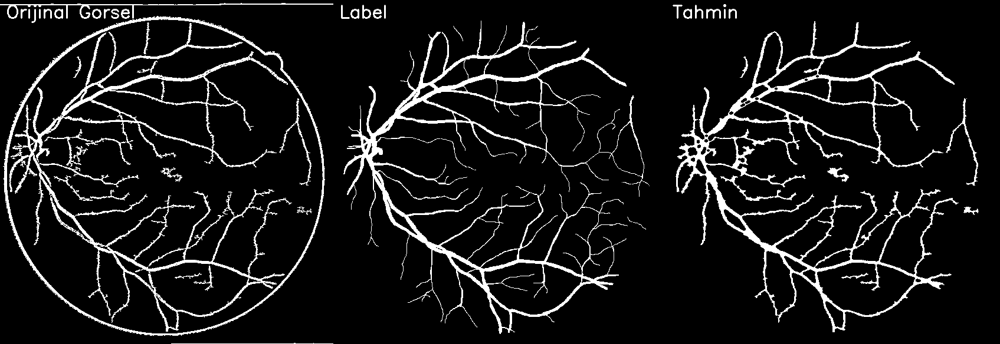

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_21.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_22.png - IoU: 0.5005


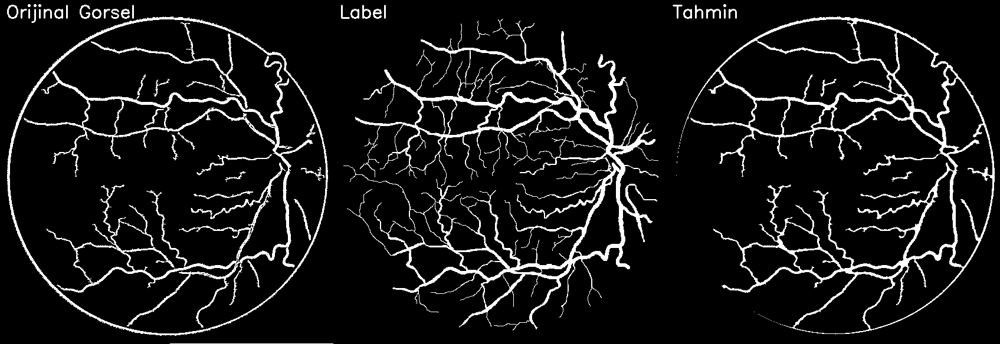

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_22.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_24.png - IoU: 0.5390


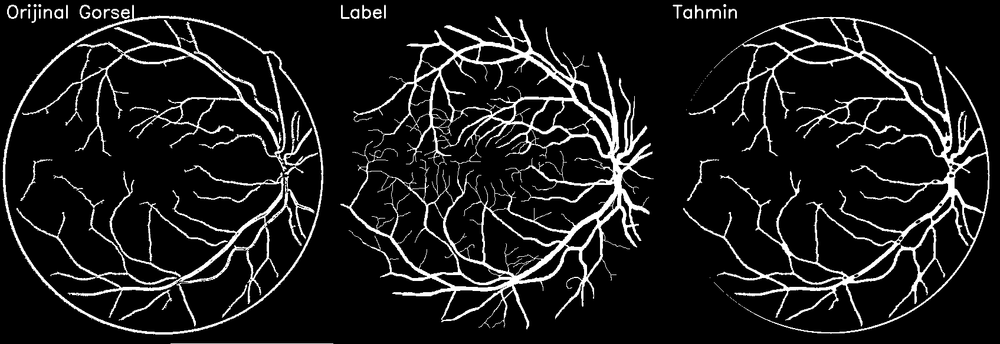

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_24.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_27.png - IoU: 0.5833


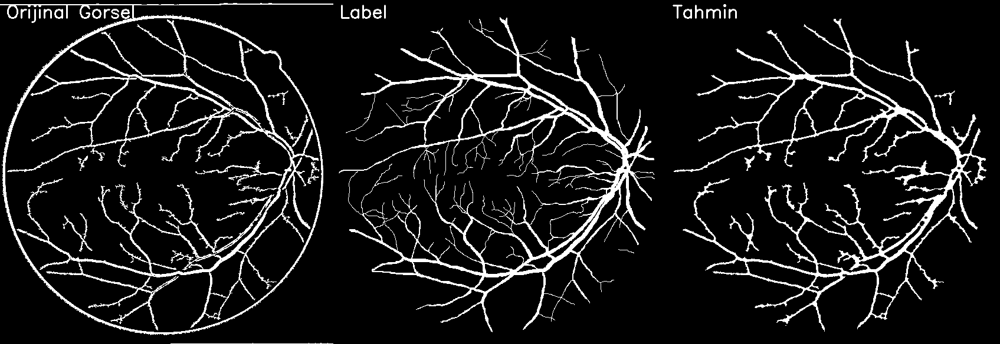

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_27.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_28.png - IoU: 0.5194


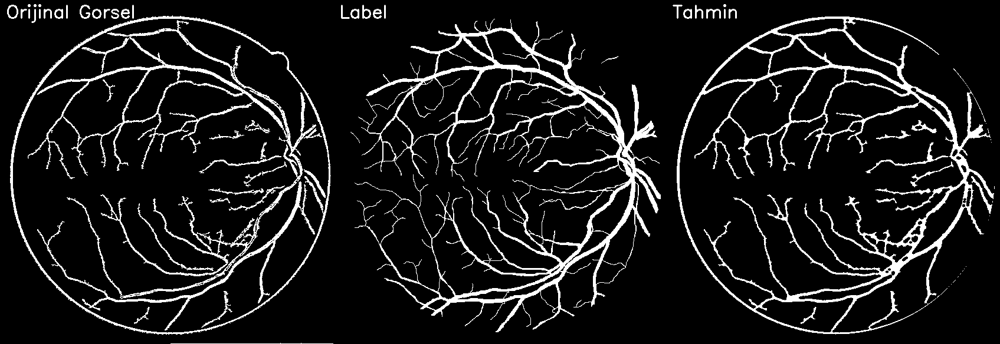

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_28.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_31.png - IoU: 0.5500


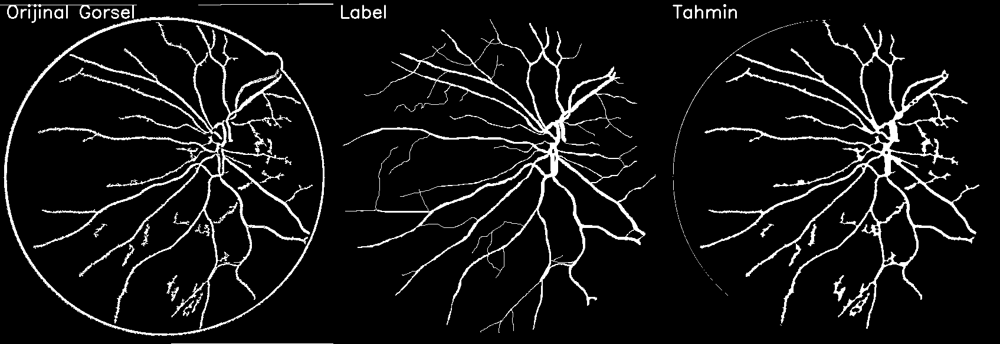

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_31.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_32.png - IoU: 0.5351


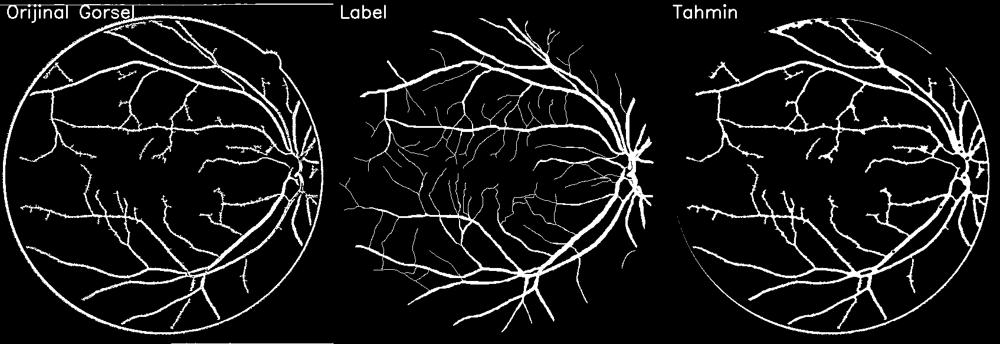

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_32.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_33.png - IoU: 0.5081


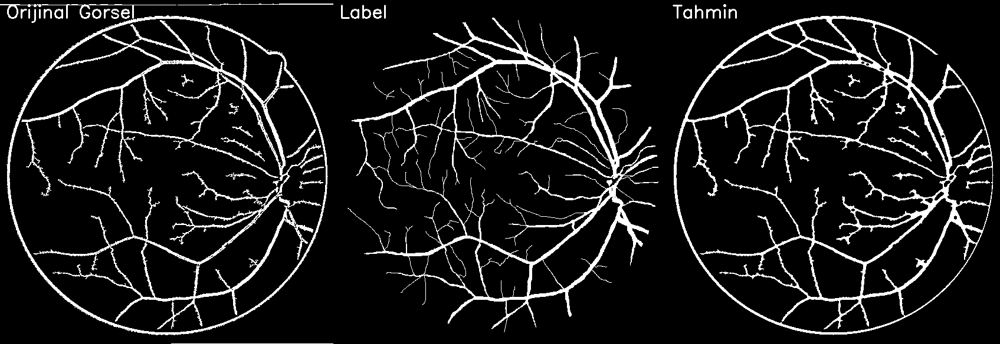

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_33.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_35.png - IoU: 0.5587


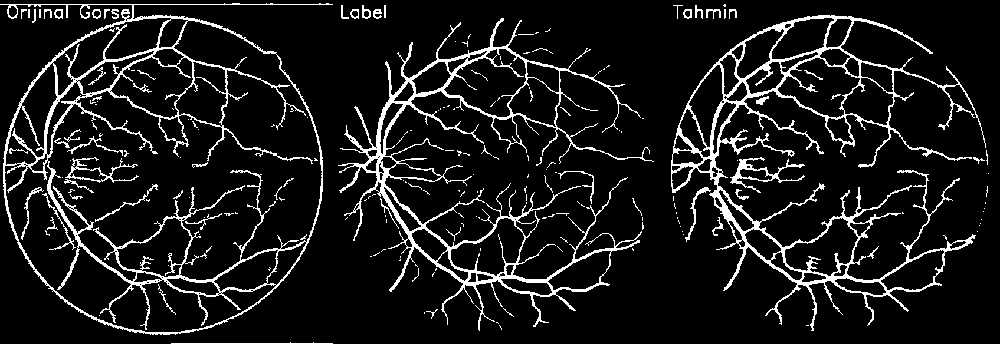

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_35.png segmentasyonu ekranda gösterildi.
HOG özellikleri çıkarıldı: (13812120,)
Görsel: /content/drive/MyDrive/Clean_Images/clean_image_36.png - IoU: 0.5386


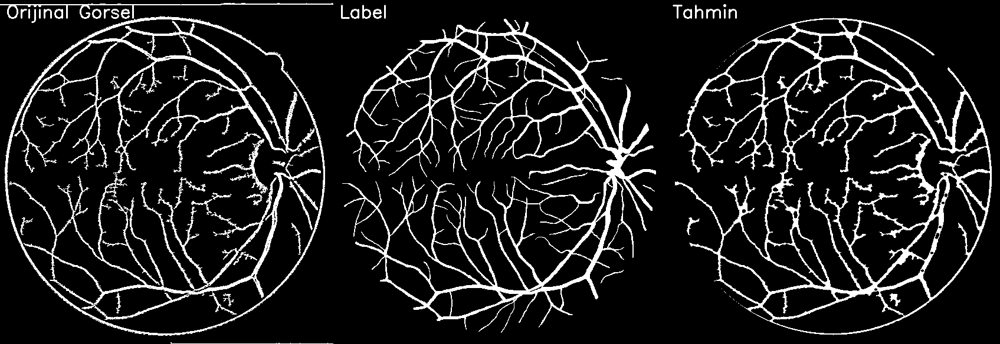

Görsel: /content/drive/MyDrive/Clean_Images/clean_image_36.png segmentasyonu ekranda gösterildi.
Ortalama IoU Skoru: 0.5427


In [14]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from sklearn.mixture import GaussianMixture
import os
from google.colab.patches import cv2_imshow  # Colab için cv2_imshow fonksiyonu

####################################
# 1) 10 Adet Görüntü - Label List #
####################################

# Burada hangi 10 görüntüyü seçeceğinizi 'img_nums' içine yazın.
img_nums = [21,22,24,27,28,31,32,33,35,36]

# Clean_Images klasöründeki orijinal resim yolları:
img_paths = [
    f"/content/drive/MyDrive/Clean_Images/clean_image_{n:02d}.png"
    for n in img_nums
]

# training/vessel klasöründeki label yolları:
test_paths = [
    f"/content/drive/MyDrive/AV_groundTruth/test/images/{n:02d}_test.png"
    for n in img_nums
]

# test/vessel klasöründeki label yolları:
labels_paths = [
    f"/content/drive/MyDrive/AV_groundTruth/training/vessel/{n:02d}_training.png"
    for n in img_nums
]
# Sonuçların kaydedileceği dizin
output_dir = "/content/drive/MyDrive/Segmented_Results"
os.makedirs(output_dir, exist_ok=True)

# HOG özellik çıkarımı
def extract_hog_features(img):
    hog = cv2.HOGDescriptor()
    h = hog.compute(img)
    return h

# LBP özellik çıkarımı
def extract_lbp_features(img, radius=1, n_points=8):
    lbp = local_binary_pattern(img, n_points, radius, method='uniform')
    return lbp

# Gaussian Mixture Model ile segmentasyon
def apply_gmm(img):
    flat_img = img.reshape(-1, 1)
    gmm = GaussianMixture(n_components=2, random_state=42)
    gmm.fit(flat_img)
    segmented = gmm.predict(flat_img)
    return segmented.reshape(img.shape)

# IoU hesaplama fonksiyonu
def calculate_iou(predicted, ground_truth):
    intersection = np.logical_and(predicted, ground_truth).sum()
    union = np.logical_or(predicted, ground_truth).sum()
    iou = intersection / union if union > 0 else 0
    return iou

# Dairesel sınırları kaldırma
def remove_circular_boundaries(img, segmented):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (9, 9), 2)

    circles = cv2.HoughCircles(
        blurred,
        cv2.HOUGH_GRADIENT, dp=1.9, minDist=500, param1=490, param2=50, minRadius=100, maxRadius=400
    )

    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        mask = np.zeros_like(segmented, dtype=np.uint8)

        for (x, y, r) in circles:
            cv2.circle(mask, (x, y), r, 255, thickness=-1)

        segmented = cv2.bitwise_and(segmented, segmented, mask=mask)

    return segmented

# IoU skorlarını saklamak için bir liste
iou_scores = []

# Görsellerin işlenmesi
for img_path, label_path in zip(img_paths, labels_paths):
    # Görselleri yükleme
    img = cv2.imread(img_path)
    label = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)

    # HOG özellik çıkarımı
    hog_features = extract_hog_features(img)
    print(f"HOG özellikleri çıkarıldı: {hog_features.shape}")

    # LBP ile görseli dönüştürme
    lbp_img = extract_lbp_features(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
    lbp_img = (lbp_img / lbp_img.max() * 255).astype(np.uint8)

    # GMM segmentasyonu
    segmented_img = apply_gmm(lbp_img)

    # Segmentasyon sonuçlarını iyileştirme
    segmented_img = (segmented_img * 255).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    final_segmented = cv2.morphologyEx(segmented_img, cv2.MORPH_CLOSE, kernel)

    # Dairesel sınırları kaldırma
    final_segmented = remove_circular_boundaries(img, final_segmented)

    # İkili maskeleme
    final_segmented_binary = final_segmented > 127
    label_binary = label > 127

    # IoU hesaplama
    iou_score = calculate_iou(final_segmented_binary, label_binary)
    print(f"Görsel: {img_path} - IoU: {iou_score:.4f}")

    # IoU skoru listeye ekleniyor
    iou_scores.append(iou_score)

    # Etiket ve tahmin görsellerini 3D yaparak 3 kanal yapıyoruz
    label_3d = cv2.cvtColor(label_binary.astype(np.uint8) * 255, cv2.COLOR_GRAY2BGR)
    prediction_3d = cv2.cvtColor(final_segmented_binary.astype(np.uint8) * 255, cv2.COLOR_GRAY2BGR)

    # Görselleri yan yana gruplama
    titles = ['Orijinal Gorsel', 'Label', 'Tahmin']
    images = [img, label_3d, prediction_3d]

    # Yazı ekleme
    for i, img in enumerate(images):
        cv2.putText(img, titles[i], (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Görselleri yatayda birleştirme
    combined_img = np.hstack(images)  # Görselleri yatayda birleştirme

    # Sonuçları ekranda gösterme
    cv2_imshow(combined_img)
    print(f"Görsel: {img_path} segmentasyonu ekranda gösterildi.")

# Ortalama IoU hesaplama
average_iou = np.mean(iou_scores)
print(f"Ortalama IoU Skoru: {average_iou:.4f}")
